##Setup

You will need to make a copy of this notebook in your Google Drive before you can edit the homework files. You can do so with **File &rarr; Save a copy in Drive**. Please run on GPU: Runtime -> Change runtime type -> Hardware accelerator -> T4 GPU

In [1]:
#@title mount your Google Drive
#@markdown Your work will be stored in a folder called `hw_16831` by default to prevent Colab instance timeouts from deleting your edits.

import os
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
#@title set up mount symlink

DRIVE_PATH = '/content/gdrive/My\ Drive/hw_16831'
DRIVE_PYTHON_PATH = DRIVE_PATH.replace('\\', '')
if not os.path.exists(DRIVE_PYTHON_PATH):
  %mkdir $DRIVE_PATH

## the space in `My Drive` causes some issues,
## make a symlink to avoid this
SYM_PATH = '/content/hw_16831'
if not os.path.exists(SYM_PATH):
  !ln -s $DRIVE_PATH $SYM_PATH

<>:3: SyntaxWarning: invalid escape sequence '\ '
<>:3: SyntaxWarning: invalid escape sequence '\ '
/tmp/ipython-input-3425321108.py:3: SyntaxWarning: invalid escape sequence '\ '
  DRIVE_PATH = '/content/gdrive/My\ Drive/hw_16831'


In [3]:
#@title apt install requirements

#@markdown Run each section with Shift+Enter

#@markdown Double-click on section headers to show code.

!apt update
!apt install -y --no-install-recommends \
        build-essential \
        curl \
        git \
        gnupg2 \
        make \
        cmake \
        ffmpeg \
        swig \
        libz-dev \
        unzip \
        zlib1g-dev \
        libglfw3 \
        libglfw3-dev \
        libxrandr2 \
        libxinerama-dev \
        libxi6 \
        libxcursor-dev \
        libgl1-mesa-dev \
        libgl1-mesa-glx \
        libglew-dev \
        libosmesa6-dev \
        lsb-release \
        ack-grep \
        patchelf \
        wget \
        xpra \
        xserver-xorg-dev \
        xvfb \
        python3-opengl \
        ffmpeg

Hit:1 https://cli.github.com/packages stable InRelease
Get:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [2,008 kB]
Hit:6 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:10 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [3,327 kB]
Get:13 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 

In [4]:
#@title clone homework repo

# if free-mujoco-py version error appears, run next two cells

%cd $SYM_PATH
# !git clone https://github.com/LeCAR-Lab/16831-F25-HW.git
%cd 16831-F25-HW/hw1
%pip install -r requirements.txt
%pip install -e .

/content/gdrive/My Drive/hw_16831
/content/gdrive/My Drive/hw_16831/16831-F25-HW/hw1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 732.2/732.2 kB 36.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
ERROR: Could not find a version that satisfies the requirement torch==1.12.1 (from versions: 2.2.0, 2.2.1, 2.2.2, 2.3.0, 2.3.1, 2.4.0, 2.4.1, 2.5.0, 2.5.1, 2.6.0, 2.7.0, 2.7.1, 2.8.0)
ERROR: No matching distribution found for torch==1.12.1
Obtaining file:///content/gdrive/My%20Drive/hw_16831/16831-F25-HW/hw1
  Preparing metadata (setup.py) ... done
  Running setup.py develop for rob831


In [5]:
# downloads mujoco from source
!wget https://mujoco.org/download/mujoco210-linux-x86_64.tar.gz
!tar xzvf mujoco210-linux-x86_64.tar.gz
!mkdir -p ~/.mujoco
!mv mujoco210 ~/.mujoco/mujoco210
!rm mujoco*

%pip install -U mujoco
%pip install -U 'mujoco-py<2.2,>=2.1'
%pip install -U pyvirtualdisplay
%pip install -U gym-notebook-wrapper
%pip install -U "cython<3"

!cp /root/.mujoco/mujoco210/bin/*.so /usr/lib/x86_64-linux-gnu/

--2025-09-19 01:32:32--  https://mujoco.org/download/mujoco210-linux-x86_64.tar.gz
Resolving mujoco.org (mujoco.org)... 216.239.38.21, 216.239.32.21, 216.239.34.21, ...
Connecting to mujoco.org (mujoco.org)|216.239.38.21|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/google-deepmind/mujoco/releases/download/2.1.0/mujoco210-linux-x86_64.tar.gz [following]
--2025-09-19 01:32:32--  https://github.com/google-deepmind/mujoco/releases/download/2.1.0/mujoco210-linux-x86_64.tar.gz
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/400501136/1f51148e-4e64-4a12-a400-d6f1e21be444?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-09-19T02%3A06%3A33Z&rscd=attachment%3B+filename%3Dmujoco210-linux-x86_64.tar.gz&rsct=application%2Foctet-stre

In [6]:
# set env variables
import os
os.environ['LD_LIBRARY_PATH'] += ':/root/.mujoco/mujoco210/bin'
os.environ['MUJOCO_PY_MUJOCO_PATH'] = '/root/.mujoco/mujoco210'
os.environ['LD_LIBRARY_PATH'] += ':/usr/lib/nvidia'

In [7]:
#@title set up virtual display

from pyvirtualdisplay import Display

display = Display(visible=0, size=(1400, 900))
display.start()

In [8]:
#@title test virtual display

#@markdown If you see a video of a four-legged ant fumbling about, setup is complete!

import numpy as np
if not hasattr(np, "bool8"):
    np.bool8 = np.bool_

import gym
import gnwrapper

env = gnwrapper.LoopAnimation(gym.make('Ant-v2'))

observation = env.reset()
for i in range(100):
    obs, rew, term, _ = env.step(env.action_space.sample())
    env.render()
    if term:
      break

env.display()
env.close()

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/usr/local/lib/python3.12/dist-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment Ant-v2 is out of date. You should consider upgrading to version `v4`.
  logger.warn(
/usr/local/lib/python3.12/dist-packages/Cython/Distutils/old_build_ext.py:15: DeprecationWarning: dep_util is Deprecated. Use functions from setuptools instead.
  from distutils.dep_util import newer, newer_group
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UT

Compiling /usr/local/lib/python3.12/dist-packages/mujoco_py/cymj.pyx because it depends on /usr/local/lib/python3.12/dist-packages/Cython/Includes/cpython/object.pxd.
[1/1] Cythonizing /usr/local/lib/python3.12/dist-packages/mujoco_py/cymj.pyx


INFO:root:running build_ext
INFO:root:building 'mujoco_py.cymj' extension
INFO:root:creating /usr/local/lib/python3.12/dist-packages/mujoco_py/generated/_pyxbld_2.1.2.14_312_linuxcpuextensionbuilder/temp.linux-x86_64-cpython-312/usr/local/lib/python3.12/dist-packages/mujoco_py
INFO:root:creating /usr/local/lib/python3.12/dist-packages/mujoco_py/generated/_pyxbld_2.1.2.14_312_linuxcpuextensionbuilder/temp.linux-x86_64-cpython-312/usr/local/lib/python3.12/dist-packages/mujoco_py/gl
INFO:root:x86_64-linux-gnu-gcc -fno-strict-overflow -Wsign-compare -DNDEBUG -g -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -g -fwrapv -O2 -fPIC -I/usr/local/lib/python3.12/dist-packages/mujoco_py -I/root/.mujoco/mujoco210/include -I/usr/local/lib/python3.12/dist-packages/numpy/_core/include -I/usr/include/python3.12 -c /usr/local/lib/python3.12/dist-packages/mujoco_py/cymj.c -o /usr/local/lib/python3.12/dist-packages/mujoco_py/generated/_pyxbld_2.1.2.14_312_linuxcpuextensionbuilder/t

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


## Editing Code

To edit code, click the folder icon on the left menu. Navigate to the corresponding file (`hw_16831/...`). Double click a file to open an editor. There is a timeout of about ~12 hours with Colab while it is active (and less if you close your browser window). We sync your edits to Google Drive so that you won't lose your work in the event of an instance timeout, but you will need to re-mount your Google Drive and re-install packages with every new instance.

## Run Behavior Cloning (Problem 1)

In [9]:
import importlib

!pip install tensorboardX

import rob831.policies.MLP_policy
import rob831.agents.bc_agent
import rob831.infrastructure.rl_trainer
import rob831.infrastructure.utils

importlib.reload(rob831.policies.MLP_policy)
importlib.reload(rob831.agents.bc_agent)
importlib.reload(rob831.infrastructure.rl_trainer)
importlib.reload(rob831.infrastructure.utils)

from rob831.infrastructure.rl_trainer import RL_Trainer
from rob831.agents.bc_agent import BCAgent
from rob831.policies.loaded_gaussian_policy import LoadedGaussianPolicy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 9.2 MB/s eta 0:00:00


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [10]:
#@title imports
import os
import time
import numpy as np

from rob831.infrastructure.rl_trainer import RL_Trainer
from rob831.agents.bc_agent import BCAgent
from rob831.policies.loaded_gaussian_policy import LoadedGaussianPolicy

# %load_ext autoreload
# %autoreload 2

In [150]:
#@title runtime arguments

class Args:

  def __getitem__(self, key):
    return getattr(self, key)

  def __setitem__(self, key, val):
    setattr(self, key, val)

  #@markdown expert data
  expert_policy_file = 'rob831/policies/experts/Ant.pkl' #@param
  expert_data = 'rob831/expert_data/expert_data_Ant-v2.pkl' #@param
  env_name = 'Ant-v2' #@param ['Ant-v2', 'Humanoid-v2', 'Walker2d-v2', 'HalfCheetah-v2', 'Hopper-v2']
  exp_name = 'test_bc_Ant_compare_step1200_check' #@param
  do_dagger = False #@param {type: "boolean"}
  ep_len = 1000 #@param {type: "integer"}
  save_params = False #@param {type: "boolean"}

  num_agent_train_steps_per_iter = 1200 #@param {type: "integer"})
  n_iter = 1 #@param {type: "integer"})

  #@markdown batches & buffers
  batch_size = 1000 #@param {type: "integer"})
  eval_batch_size = 2000 #@param {type: "integer"}
  train_batch_size = 100 #@param {type: "integer"}
  max_replay_buffer_size = 1000000 #@param {type: "integer"}

  #@markdown network
  n_layers = 5 #@param {type: "integer"}
  size = 64 #@param {type: "integer"}
  learning_rate = 4e-3 #@param {type: "number"}

  #@markdown logging
  video_log_freq = -1 #@param {type: "integer"}
  scalar_log_freq = 1 #@param {type: "integer"}

  #@markdown gpu & run-time settings
  no_gpu = False #@param {type: "boolean"}
  which_gpu = 0 #@param {type: "integer"}
  seed = 1 #@param {type: "integer"}

args = Args()


In [151]:
#@title define `BC_Trainer`
class BC_Trainer(object):

    def __init__(self, params):
        #######################
        ## AGENT PARAMS
        #######################

        agent_params = {
            'n_layers': params['n_layers'],
            'size': params['size'],
            'learning_rate': params['learning_rate'],
            'max_replay_buffer_size': params['max_replay_buffer_size'],
            }

        self.params = params
        self.params['agent_class'] = BCAgent ## TODO: look in here and implement this
        self.params['agent_params'] = agent_params

        ################
        ## RL TRAINER
        ################

        self.rl_trainer = RL_Trainer(self.params) ## TODO: look in here and implement this

        #######################
        ## LOAD EXPERT POLICY
        #######################

        print('Loading expert policy from...', self.params['expert_policy_file'])
        self.loaded_expert_policy = LoadedGaussianPolicy(self.params['expert_policy_file'])
        print('Done restoring expert policy...')

    def run_training_loop(self):

        self.rl_trainer.run_training_loop(
            n_iter=self.params['n_iter'],
            initial_expertdata=self.params['expert_data'],
            collect_policy=self.rl_trainer.agent.actor,
            eval_policy=self.rl_trainer.agent.actor,
            relabel_with_expert=self.params['do_dagger'],
            expert_policy=self.loaded_expert_policy,
        )


In [152]:
#@title create directory for logging

if args.do_dagger:
    logdir_prefix = 'q2_'
    assert args.n_iter>1, ('DAgger needs more than 1 iteration (n_iter>1) of training, to iteratively query the expert and train (after 1st warmstarting from behavior cloning).')
else:
    logdir_prefix = 'q1_'
    assert args.n_iter==1, ('Vanilla behavior cloning collects expert data just once (n_iter=1)')

data_path ='/content/hw_16831/hw1/data'
if not (os.path.exists(data_path)):
    os.makedirs(data_path)
logdir = logdir_prefix + args.exp_name + '_' + args.env_name + \
         '_' + time.strftime("%d-%m-%Y_%H-%M-%S")
logdir = os.path.join(data_path, logdir)
args['logdir'] = logdir
if not(os.path.exists(logdir)):
    os.makedirs(logdir)

In [153]:
# Make sure you're in the 16831-F25-HW/hw1 folder when running this.
## run training
print(args.logdir)
trainer = BC_Trainer(args)
trainer.run_training_loop()

/content/hw_16831/hw1/data/q1_test_bc_Ant_compare_step1200_check_Ant-v2_19-09-2025_02-33-55
########################
logging outputs to  /content/hw_16831/hw1/data/q1_test_bc_Ant_compare_step1200_check_Ant-v2_19-09-2025_02-33-55
########################
Using GPU id 0
Loading expert policy from... rob831/policies/experts/Ant.pkl
obs (1, 111) (1, 111)
Done restoring expert policy...


********** Iteration 0 ************
First Iteration: Loading training data...
Finish loading training data!

Training agent using sampled data from replay buffer...


/usr/local/lib/python3.12/dist-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment Ant-v2 is out of date. You should consider upgrading to version `v4`.
  logger.warn(



Beginning logging procedure...



INFO:tensorboardX.summary:Summary name Training Loss is illegal; using Training_Loss instead.


Eval_AverageReturn : 4669.8583984375
Eval_StdReturn : 62.951416015625
Eval_MaxReturn : 4732.8095703125
Eval_MinReturn : 4606.90673828125
Eval_AverageEpLen : 1000.0
Train_AverageReturn : 4713.6533203125
Train_StdReturn : 12.196533203125
Train_MaxReturn : 4725.849609375
Train_MinReturn : 4701.45654296875
Train_AverageEpLen : 1000.0
Train_EnvstepsSoFar : 0
TimeSinceStart : 4.337145805358887
Training Loss : 0.0015538528095930815
Initial_DataCollection_AverageReturn : 4713.6533203125
Done logging...




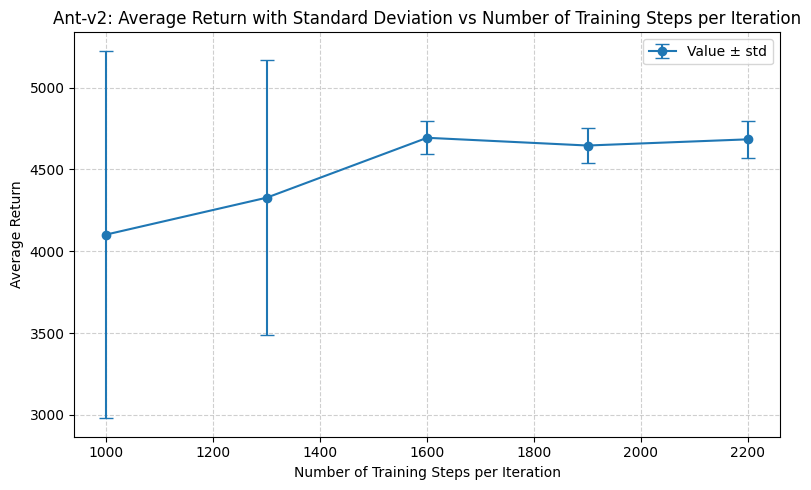

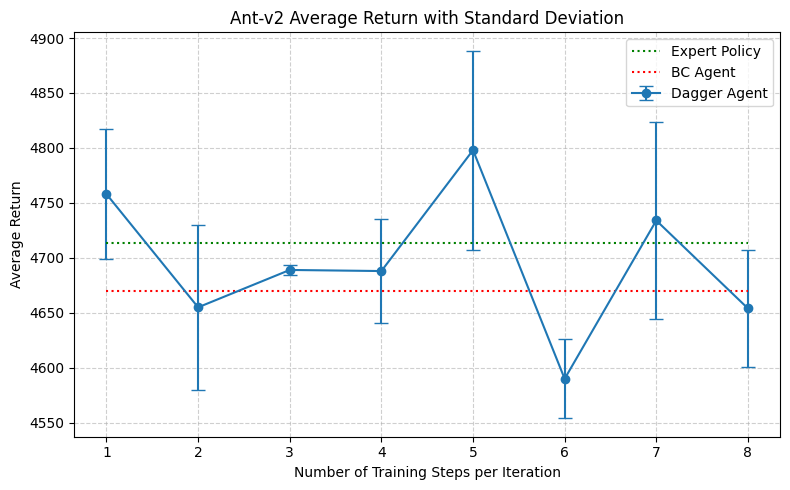

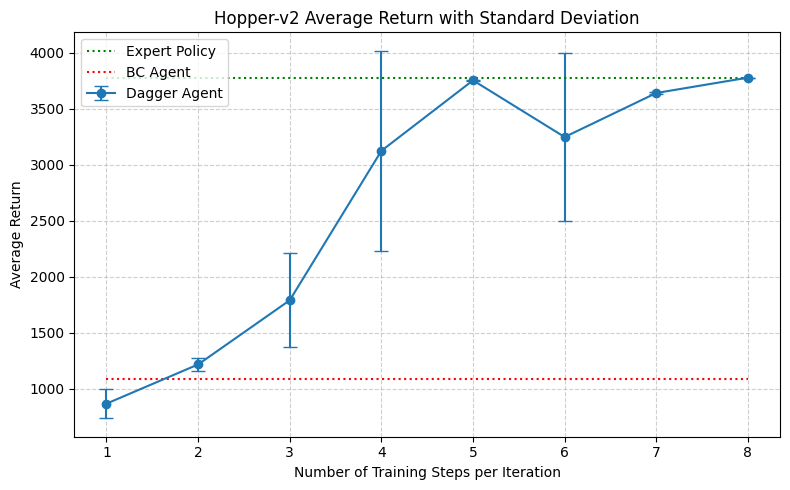

In [4]:
# Draw Plot
import matplotlib.pyplot as plt
import numpy as np

# Figure 1
# Num of Data
n = 5
num_of_steps = np.array([1000, 1300, 1600, 1900, 2200])
avgs = np.array([4102.3212890625,4327.63427734375, 4693.4775390625, 4646.2333984375, 4684.02587890625])
stds = np.array([1123.25634765625, 841.0430908203125, 101.44367218017578, 106.84512329101562, 113.53807830810547])

# Plot with error bars
plt.figure(figsize=(8, 5))
plt.errorbar(num_of_steps, avgs, yerr=stds, fmt='-o', capsize=5, label="Value ± std")

plt.xlabel("Number of Training Steps per Iteration")
plt.title("Ant-v2: Average Return with Standard Deviation vs Number of Training Steps per Iteration")
plt.ylabel("Average Return")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

# Figure 2
# Num of Iterations
n = 8
iterations = np.arange(1, n+1)

# Ant data
ant_bc_avg = np.array([4758,4655, 4689, 4688, 4798,4590,4734,4654])
ant_bc_std = np.array([59.27, 74.98, 4.861, 47.71,90.44,35.99,89.22,53.45])

# Plot with error bars
plt.figure(figsize=(8, 5))
plt.errorbar(iterations, ant_bc_avg, yerr=ant_bc_std, fmt='-o', capsize=5, label="Dagger Agent")

plt.xlabel("Number of Training Steps per Iteration")
plt.ylabel("Average Return")
plt.title("Ant-v2 Average Return with Standard Deviation")
plt.hlines(y=4713.6533203125, xmin=1, xmax=8, color="g", linestyle=":", label= "Expert Policy")
plt.hlines(y=4669.8583984375, xmin=1, xmax=8, color="r", linestyle=":", label= "BC Agent")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

# Hopper Data
hopper_bc_avg = np.array([868.2, 1218, 1791, 3125, 3754, 3248, 3641, 3778])
hopper_bc_std = np.array([131.1, 60.18, 417.6, 893.4, 6.309, 751.5, 6.288, 0.6487])

# Plot with error bars
plt.figure(figsize=(8, 5))
plt.errorbar(iterations, hopper_bc_avg, yerr=hopper_bc_std, fmt='-o', capsize=5, label="Dagger Agent")

plt.xlabel("Number of Training Steps per Iteration")
plt.ylabel("Average Return")
plt.title("Hopper-v2 Average Return with Standard Deviation")
plt.hlines(y=3772.67041015625, xmin=1, xmax=8, color="g", linestyle=":", label= "Expert Policy")
plt.hlines(y=1084.026123046875, xmin=1, xmax=8, color="r", linestyle=":", label= "BC Agent")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

In [145]:
#@markdown You can visualize your runs with tensorboard from within the notebook

%load_ext tensorboard
%tensorboard --logdir /content/hw_16831/hw1/data

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


## Running DAgger (Problem 2)
Modify the settings above:
1. check the `do_dagger` box
2. set `n_iters` to `10`
and then rerun the code.